<a href="https://colab.research.google.com/github/JeffBaksa/capstone2/blob/main/loadingin_and_models(colab).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import os
import PIL

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Activation, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras import Model
#import efficientnet.keras as effnet

from datetime import datetime
from skimage import io, color, filters
from skimage.transform import resize, rotate

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#tf.__version__
#keras.__version__

In [ ]:
#!pip install -U efficientnet

In [112]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [113]:
# Tensorboard set up
logdir = 'drive/MyDrive/capstone2/logs/image/' + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir = logdir, histogram_freq=1)

In [104]:
# image data generator & flow from dir
train_path = 'drive/MyDrive/capstone2/images/train'
test_path = 'drive/MyDrive/capstone2/images/test'
valid_path = 'drive/MyDrive/capstone2/images/validation'
bs = 16

In [105]:
train_batches = ImageDataGenerator(rescale=1/255, horizontal_flip=True, vertical_flip=True, shear_range=0.2, rotation_range=60).flow_from_directory(train_path, target_size=(224, 224), batch_size=bs)

Found 1635 images belonging to 2 classes.


In [106]:
test_batches = ImageDataGenerator(rescale=1/255).flow_from_directory(test_path, target_size=(224, 224), batch_size=bs)

Found 205 images belonging to 2 classes.


In [107]:
valid_batches = ImageDataGenerator(rescale=1/255).flow_from_directory(valid_path, target_size=(224, 224), batch_size=bs)

Found 204 images belonging to 2 classes.


## Display Image / Categories / EDA

In [ ]:
# for image in train_batches:
#     print(image)

In [9]:
poison_ivy = io.imread('drive/MyDrive/capstone2/images/train/poison_ivy/103.jpg')
poison_ivy2 = io.imread('drive/MyDrive/capstone2/images/train/poison_ivy/360261.jpg')
poison_ivy3 = io.imread('drive/MyDrive/capstone2/images/train/poison_ivy/360440.jpg')
poison_ivy4 = io.imread('drive/MyDrive/capstone2/images/train/poison_ivy/360316.jpg')
poison_ivy5 = io.imread('drive/MyDrive/capstone2/images/train/poison_ivy/360967.jpg')

rasp = io.imread('drive/MyDrive/capstone2/images/train/not_poison_ivy/rasp_4561.jpg')
virgc = io.imread('drive/MyDrive/capstone2/images/train/not_poison_ivy/vc52.jpg')
boxeld = io.imread('drive/MyDrive/capstone2/images/train/not_poison_ivy/be05.jpg')
bostivy = io.imread('drive/MyDrive/capstone2/images/train/not_poison_ivy/bi40.jpg')
skunk = io.imread('drive/MyDrive/capstone2/images/train/not_poison_ivy/sk7 7.jpg')

In [10]:
poison_ivy.shape

(201, 251, 3)

In [11]:
rasp.shape

(500, 375, 3)

In [12]:
poison_ivy = resize(poison_ivy, (300, 300))
poison_ivy2 = resize(poison_ivy2, (300, 300))
poison_ivy3 = resize(poison_ivy3, (300, 300))
poison_ivy4 = resize(poison_ivy4, (300, 300))
poison_ivy5 = resize(poison_ivy5, (300, 300))

rasp = resize(rasp, (300, 300))
virgc = resize(virgc, (300, 300))
boxeld = resize(boxeld, (300, 300))
bostivy = resize(bostivy, (300, 300))
skunk = resize(skunk, (300, 300))

Text(0.5, 1.0, 'Skunkbush')

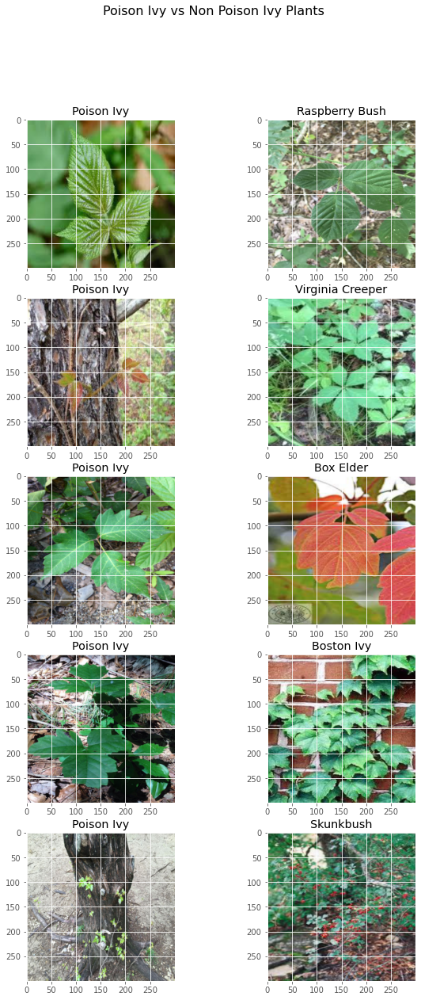

In [13]:
# Plot An Example of Poison Ivy vs Not Poison Ivy images being used
fig, ax = plt.subplots(5, 2, figsize=(10, 20))
ax[0, 0].imshow(poison_ivy)
ax[0, 1].imshow(rasp)
ax[1, 0].imshow(poison_ivy2)
ax[1, 1].imshow(virgc)
ax[2, 0].imshow(poison_ivy3)
ax[2, 1].imshow(boxeld)
ax[3, 0].imshow(poison_ivy4)
ax[3, 1].imshow(bostivy)
ax[4, 0].imshow(poison_ivy5)
ax[4, 1].imshow(skunk)

# Set titles, labels, etc.
fig.suptitle('Poison Ivy vs Non Poison Ivy Plants', fontsize=16)
ax[0, 0].set_title('Poison Ivy')
ax[0, 1].set_title('Raspberry Bush')
ax[1, 0].set_title('Poison Ivy')
ax[1, 1].set_title('Virginia Creeper')
ax[2, 0].set_title('Poison Ivy')
ax[2, 1].set_title('Box Elder')
ax[3, 0].set_title('Poison Ivy')
ax[3, 1].set_title('Boston Ivy')
ax[4, 0].set_title('Poison Ivy')
ax[4, 1].set_title('Skunkbush')

#plt.savefig('presentation_images/pi_vs_nonpi.jpg')

## Build Baseline Model

In [59]:
# Building Baseline Model
base_model = keras.Sequential()

# Convolutional layer and maxpool layer 1
base_model.add(keras.layers.Conv2D(32,(3,3),activation='relu',input_shape=(224,224,3)))
base_model.add(keras.layers.MaxPool2D(2,2))
# Convolutional layer and maxpool layer 2
base_model.add(keras.layers.Conv2D(64,(3,3),activation='relu'))
base_model.add(keras.layers.MaxPool2D(2,2))
# This layer flattens the resulting image array to 1D array
base_model.add(keras.layers.Flatten())

# Hidden layer with 512 neurons and Rectified Linear Unit activation function 
# model.add(keras.layers.Dense(512,activation='relu'))

# Output layer with single neuron which gives 0 for not poison ivy or 1 for poison ivy
# Here we use sigmoid activation function which makes our model output to lie between 0 and 1
opt = SGD(learning_rate=0.0001)
base_model.add(keras.layers.Dense(2, activation='sigmoid'))
base_model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
base_history = base_model.fit(train_batches, validation_data=valid_batches, epochs=5, verbose=1)

Epoch 1/5
273/273 [==============================] - 26s 96ms/step - loss: 0.6917 - accuracy: 0.5394 - val_loss: 0.6873 - val_accuracy: 0.5490
Epoch 2/5
273/273 [==============================] - 26s 96ms/step - loss: 0.6904 - accuracy: 0.5480 - val_loss: 0.6866 - val_accuracy: 0.5490
Epoch 3/5
273/273 [==============================] - 26s 96ms/step - loss: 0.6895 - accuracy: 0.5511 - val_loss: 0.6851 - val_accuracy: 0.5490
Epoch 4/5
273/273 [==============================] - 26s 95ms/step - loss: 0.6883 - accuracy: 0.5529 - val_loss: 0.6834 - val_accuracy: 0.5490
Epoch 5/5
273/273 [==============================] - 26s 96ms/step - loss: 0.6851 - accuracy: 0.5590 - val_loss: 0.6825 - val_accuracy: 0.6078


In [ ]:
base_model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 186624)            0         
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 186625    
Total params: 206,017
Trainable params: 206,017
Non-trainable params: 0
_______________________________________________

## VGG Model

In [ ]:
# VGG Model
vgg = tf.keras.applications.vgg16.VGG16()

model = Sequential()

for layer in vgg.layers[:-1]:
    model.add(layer)

for layer in model.layers[:-1]:
    layer.trainable = False

# Defining Model
n_classes = 2
model.add(Dense(n_classes, activation='sigmoid'))
opt = SGD(learning_rate=0.0001)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
#model.summary()

# Fitting the Model
pgg_history = model.fit(train_batches, validation_data=valid_batches, epochs=5, verbose=1)

Epoch 1/5
103/103 [==============================] - 232s 2s/step - loss: 2.5519 - accuracy: 0.5674 - val_loss: 0.6591 - val_accuracy: 0.7402
Epoch 2/5
103/103 [==============================] - 267s 3s/step - loss: 0.5888 - accuracy: 0.7112 - val_loss: 0.9056 - val_accuracy: 0.4853
Epoch 3/5
103/103 [==============================] - 259s 3s/step - loss: 0.5859 - accuracy: 0.7257 - val_loss: 0.5967 - val_accuracy: 0.6961
Epoch 4/5
103/103 [==============================] - 213s 2s/step - loss: 0.5548 - accuracy: 0.7294 - val_loss: 0.6545 - val_accuracy: 0.5686
Epoch 5/5
103/103 [==============================] - 213s 2s/step - loss: 0.4986 - accuracy: 0.7561 - val_loss: 0.5967 - val_accuracy: 0.6961


In [ ]:
pgg_history.history

{'loss': [2.551922559738159,
  0.5888381004333496,
  0.585919201374054,
  0.5548318028450012,
  0.4985816776752472],
 'accuracy': [0.5673543810844421,
  0.7111650705337524,
  0.7257281541824341,
  0.7293689250946045,
  0.7560679316520691],
 'val_loss': [0.6591393947601318,
  0.905603289604187,
  0.5967260003089905,
  0.6544623970985413,
  0.596733570098877],
 'val_accuracy': [0.7401960492134094,
  0.4852941036224365,
  0.6960784196853638,
  0.5686274766921997,
  0.6960784196853638]}

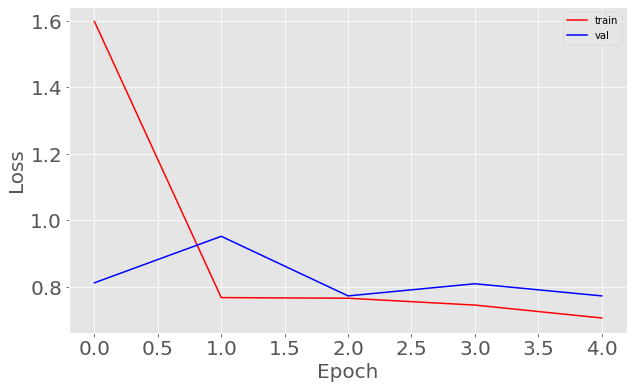

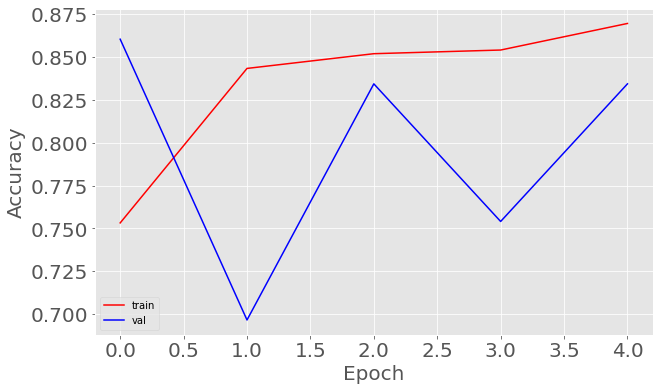

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10,6))
# Plot the loss
ax.plot(np.sqrt(pgg_history.history['loss']), 'r', label='train')
ax.plot(np.sqrt(pgg_history.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Loss', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

# Plot the accuracy
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(pgg_history.history['accuracy']), 'r', label='train')
ax.plot(np.sqrt(pgg_history.history['val_accuracy']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Accuracy', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

In [ ]:
# VGG w/ adam optimizer
vgg = tf.keras.applications.vgg16.VGG16()

model2 = Sequential()

for layer in vgg.layers[:-1]:
    model2.add(layer)

for layer in model2.layers[:-1]:
    layer.trainable = False

# Defining Model
n_classes = 2
model2.add(Dense(n_classes, activation='sigmoid'))
model2.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
#model.summary()

# Fitting the Model
pgg_history2 = model2.fit(train_batches, validation_data=valid_batches, epochs=5, verbose=1)

Epoch 1/5
103/103 [==============================] - 237s 2s/step - loss: 2.1431 - accuracy: 0.5831 - val_loss: 0.7497 - val_accuracy: 0.5098
Epoch 2/5
103/103 [==============================] - 226s 2s/step - loss: 0.6248 - accuracy: 0.6833 - val_loss: 0.7558 - val_accuracy: 0.4951
Epoch 3/5
103/103 [==============================] - 224s 2s/step - loss: 0.6685 - accuracy: 0.6766 - val_loss: 0.6468 - val_accuracy: 0.6618
Epoch 4/5
103/103 [==============================] - 222s 2s/step - loss: 0.5066 - accuracy: 0.7567 - val_loss: 0.7006 - val_accuracy: 0.6716
Epoch 5/5
103/103 [==============================] - 223s 2s/step - loss: 0.5291 - accuracy: 0.7445 - val_loss: 0.7878 - val_accuracy: 0.6029


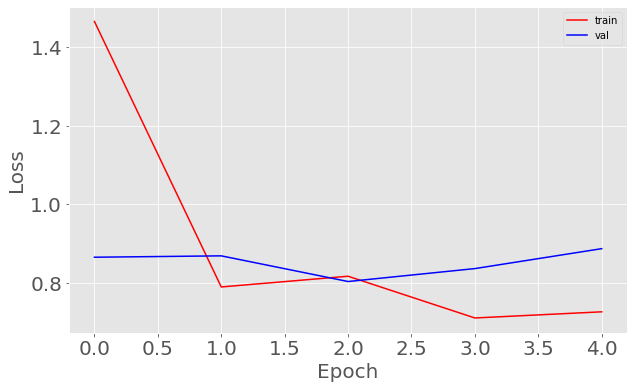

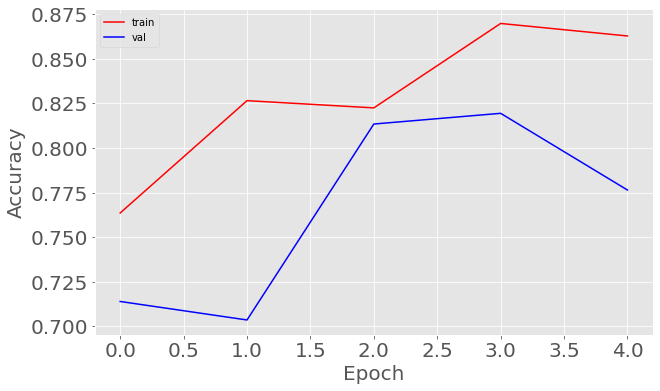

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10,6))
# Plot the loss
ax.plot(np.sqrt(pgg_history2.history['loss']), 'r', label='train')
ax.plot(np.sqrt(pgg_history2.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Loss', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

# Plot the accuracy
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(pgg_history2.history['accuracy']), 'r', label='train')
ax.plot(np.sqrt(pgg_history2.history['val_accuracy']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Accuracy', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

## Tesnorboard Set Up

In [132]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [134]:
#%reload_ext tensorboard

In [135]:
# Tensorboard set up
logdir = 'drive/MyDrive/capstone2/logs/image/' + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir = logdir, histogram_freq=1)

## Best VGG Model

In [ ]:
# Remind myself
# logdir = 'logs/image/' + datetime.now().strftime("%Y%m%d-%H%M%S")
# tensorboard_callback = TensorBoard(log_dir = logdir, histogram_freq=1)

In [117]:
vgg = tf.keras.applications.vgg16.VGG16()
model3 = Sequential()

for layer in vgg.layers[:-3]:  
    model3.add(layer)
for layer in model3.layers:
    layer.trainable = False

# Defining Model
model3.add(Dense(512, activation='relu'))
model3.add(Dropout(.1)) # helps prevent overfitting
# model3.add(Dense(256, activation='relu'))
# model3.add(Dropout(.1))
model3.add(Dense(2, activation='sigmoid'))
model3.compile(loss='binary_crossentropy', optimizer=Adam(.001), metrics=['accuracy'])

# Early Stopping
vgg3_es = EarlyStopping(monitor='val_accuracy', patience=10, verbose=1)

# Save the file name
checkpoint_path = "drive/MyDrive/capstone2/checkpoints/vgg3/cp-{epoch:04d}.ckpt" # all the trained weights
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create checkpoint
vgg3_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = checkpoint_path, 
    verbose = 1, 
    save_weights_only = True,
    save_best_only = True, # only save the best epoch
    monitor = 'val_accuracy',
    save_freq = 'epoch') # after epoch

In [118]:
model3.summary()

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)     

In [119]:
# Fitting the Model
pgg_history3 = model3.fit(train_batches, validation_data=valid_batches, epochs=50, callbacks=[vgg3_checkpoint, vgg3_es, tensorboard_callback], verbose=1)

Epoch 1/50
103/103 [==============================] - 27s 259ms/step - loss: 0.8353 - accuracy: 0.6165 - val_loss: 0.7629 - val_accuracy: 0.4265

Epoch 00001: val_accuracy improved from -inf to 0.42647, saving model to drive/MyDrive/capstone2/checkpoints/vgg3/cp-0001.ckpt
Epoch 2/50
103/103 [==============================] - 27s 260ms/step - loss: 0.5844 - accuracy: 0.6972 - val_loss: 0.6305 - val_accuracy: 0.6765

Epoch 00002: val_accuracy improved from 0.42647 to 0.67647, saving model to drive/MyDrive/capstone2/checkpoints/vgg3/cp-0002.ckpt
Epoch 3/50
103/103 [==============================] - 27s 258ms/step - loss: 0.5306 - accuracy: 0.7425 - val_loss: 0.7880 - val_accuracy: 0.6422

Epoch 00003: val_accuracy did not improve from 0.67647
Epoch 4/50
103/103 [==============================] - 26s 256ms/step - loss: 0.5016 - accuracy: 0.7584 - val_loss: 0.5874 - val_accuracy: 0.7206

Epoch 00004: val_accuracy improved from 0.67647 to 0.72059, saving model to drive/MyDrive/capstone2/chec

In [116]:
model3.load_weights('drive/MyDrive/capstone2/checkpoints/vgg3/cp-0013.ckpt')
loss, acc = model3.evaluate(valid_batches, verbose=1)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

13/13 [==============================] - 2s 128ms/step - loss: 0.4237 - accuracy: 0.8333
Restored model, accuracy: 83.33%


In [ ]:
model3.predict(test_batches).round(3)

In [245]:
model3.predict_on_batch(test_batches[0][0]).round(3)

array([[0.444, 0.619],
       [0.979, 0.036],
       [0.524, 0.507],
       [0.822, 0.197],
       [0.921, 0.118],
       [0.418, 0.557],
       [0.889, 0.166],
       [0.891, 0.148],
       [0.932, 0.092],
       [0.925, 0.11 ],
       [0.999, 0.001],
       [0.029, 0.973],
       [0.293, 0.687],
       [0.999, 0.002],
       [0.315, 0.667],
       [0.932, 0.083]], dtype=float32)

In [246]:
test_batches[0][1]

array([[0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.]], dtype=float32)

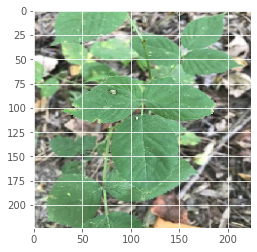

In [253]:
image = test_batches[0] # first batch
plt.imshow(image[0][1]) # second num is what image

Text(0.5, 1.0, '')

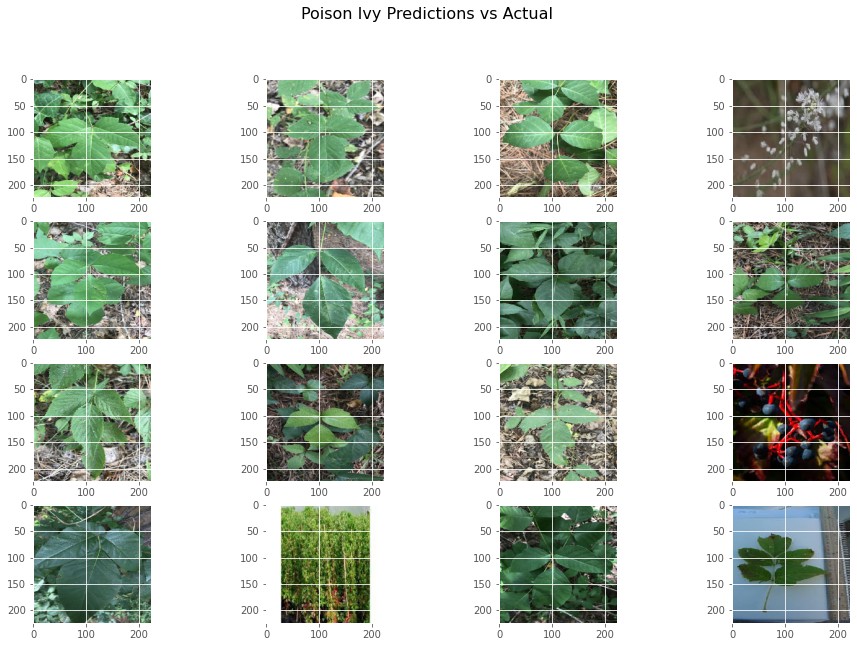

In [248]:
predictions = model3.predict_on_batch(test_batches[0][0])
labels = test_batches[0][1]

fig, ax = plt.subplots(4, 4, figsize=(16,10))
ax[0, 0].imshow(image[0][0])
ax[0, 1].imshow(image[0][1])
ax[0, 2].imshow(image[0][2])
ax[0, 3].imshow(image[0][3])
ax[1, 0].imshow(image[0][4])
ax[1, 1].imshow(image[0][5])
ax[1, 2].imshow(image[0][6])
ax[1, 3].imshow(image[0][7])
ax[2, 0].imshow(image[0][8])
ax[2, 1].imshow(image[0][9])
ax[2, 2].imshow(image[0][10])
ax[2, 3].imshow(image[0][11])
ax[3, 0].imshow(image[0][12])
ax[3, 1].imshow(image[0][13])
ax[3, 2].imshow(image[0][14])
ax[3, 3].imshow(image[0][15])

fig.suptitle('Poison Ivy Predictions vs Actual', fontsize=16)
# Titles
ax[0, 0].set_title('')
ax[0, 1].set_title('')
ax[0, 2].set_title('')
ax[0, 3].set_title('')
ax[1, 0].set_title('')
ax[1, 1].set_title('')
ax[1, 2].set_title('')
ax[1, 3].set_title('')
ax[2, 0].set_title('')
ax[2, 1].set_title('')
ax[2, 2].set_title('')
ax[2, 3].set_title('')
ax[3, 0].set_title('')
ax[3, 1].set_title('')
ax[3, 2].set_title('')
ax[3, 3].set_title('')

In [224]:
for idx, p in enumerate(predictions):
  if p[0] > p[1]:
    print(idx, p[0])
  else:
    print(idx, p[1])

[[0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]]
0 0.61916703
1 0.9794302
2 0.52356577
3 0.8222732
4 0.9214205
5 0.5574662
6 0.8892336
7 0.89101446
8 0.93235844
9 0.92482054
10 0.9985846
11 0.9725974
12 0.6874913
13 0.99890006
14 0.6669338
15 0.93187475


In [198]:
# fig, ax = plt.subplots(4, 4, figsize=(16,10))

# for k in range(0, 4): 
#   for i in range(bs):
#     for j in range(0, 4):
#       print(f"j = {j}")
#       print(f"k = {k}")
#       print(f"i = {i}")
#       print('End of loop')
#       ax[j, k].imshow(image[0][i])

In [208]:
import types
def image_plot_predict(rows, batch, model, cols=bs):  
    
    """ 
    Plots images with thier predicted class and actual class  
  
    Used after model has been fit to see results of test data
  
    Parameters: 
    rows (int): number of rows for the images displayed
    batch (ImageDataGenerator): test batch of pictures that will be predicted in model
    model : the model training images have been trained on to be used to predict test images
    cols (int) : number of columns displayed ( set to batch size )
    
    
    Returns: 
    plot: Plot of images with thier predicted class and thier actual class 
  
    """
    fig, axs = plt.subplots(rows,cols,figsize=(cols*3,rows*4))
    for i in range(rows):
        images, labels = next(batch)
        predictions = model.predict(images)
        for j, pic in enumerate(images):
            title = 'Predicted:' + ' ' + types[list(predictions[j]).index(predictions[j].max())] + ' ' + '\n' + 'Actual:' + ' ' + types[list(labels[j]).index(1)]
            if rows > 1:
                axs[i,j].imshow(pic)
                axs[i,j].set_title(title)
            else:
                axs[j].imshow(pic)
                axs[j].set_title(title)

In [ ]:
image_plot_predict(4, test_batches, model3, cols=bs) # not working

## Tensorboard

In [136]:
%tensorboard  --logdir ./logs

<IPython.core.display.Javascript object>

## Xception

In [51]:
xcep_model = tf.keras.applications.xception.Xception(input_shape = (150, 150, 3), include_top = False, weights='imagenet')

model4 = Sequential()
for layer in xcep_model.layers[:-2]:
    model4.add(layer)
for layer in model4.layers:
    layer.trainable = False

# Defining Model
#opt = SGD(learning_rate=0.001)
model4.add(Dense(512, activation='relu'))
model4.add(Dropout(.1)) # helps prevent overfitting
# model4.add(Dense(256, activation='relu'))
# model4.add(Dropout(.1))
model4.add(Dense(2, activation='sigmoid'))
model4.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Early Stopping
xcep_es = EarlyStopping(monitor='val_accuracy', patience=5, verbose=1)

# Save the file name
checkpoint_path = "drive/MyDrive/capstone2/checkpoints/vgg3/cp-{epoch:04d}.ckpt" # all the trained weights
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create checkpoint
xcep_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = checkpoint_path, 
    verbose = 1, 
    save_weights_only = True, 
    save_best_only = True, # only save the best epoch
    monitor = 'val_accuracy',
    save_freq = 'epoch') # after epoch

# Fitting the Model
xcep_history = model4.fit(train_batches, validation_data=valid_batches, epochs=20, callbacks=[xcep_checkpoint, xcep_es, tensorboard_callback], verbose=1)

83689472/83683744 [==============================] - 0s 0us/step


ValueError: ignored

In [ ]:
xcep_model.summary()

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_7[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

## ResNet34

In [139]:
from functools import partial

In [140]:
DefaultConv2D = partial(keras.layers.Conv2D, kernel_size=3, strides=1,
                        padding="SAME", use_bias=False)

class ResidualUnit(keras.layers.Layer):
    def __init__(self, filters, strides=1, activation="relu", **kwargs):
        super().__init__(**kwargs)
        self.activation = keras.activations.get(activation)
        self.main_layers = [
            DefaultConv2D(filters, strides=strides),
            keras.layers.BatchNormalization(),
            self.activation,
            DefaultConv2D(filters),
            keras.layers.BatchNormalization()]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                DefaultConv2D(filters, kernel_size=1, strides=strides),
                keras.layers.BatchNormalization()]

    def call(self, inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

In [147]:
resn_model = keras.models.Sequential()
resn_model.add(DefaultConv2D(64, kernel_size=7, strides=2,
                        input_shape=[224, 224, 3]))
resn_model.add(keras.layers.BatchNormalization())
resn_model.add(keras.layers.Activation("relu"))
resn_model.add(keras.layers.MaxPool2D(pool_size=3, strides=2, padding="SAME"))
prev_filters = 64
for filters in [64] * 3 + [128] * 4 + [256] * 6 + [512] * 3:
    strides = 1 if filters == prev_filters else 2
    resn_model.add(ResidualUnit(filters, strides=strides))
    prev_filters = filters
resn_model.add(keras.layers.GlobalAvgPool2D())
resn_model.add(keras.layers.Flatten())
resn_model.add(keras.layers.Dense(10, activation="sigmoid"))

# Compile model
resn_model.compile(loss='binary_crossentropy', optimizer=Adam(.001), metrics=['accuracy'])

# Early Stopping
resn_es = EarlyStopping(monitor='val_accuracy', patience=10, verbose=1)

# Save checkpoint file name
checkpoint_path = "drive/MyDrive/capstone2/checkpoints/resnet/cp-{epoch:04d}.ckpt" # all the trained weights
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create checkpoint
resn_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath = checkpoint_path, 
    verbose = 1, 
    save_weights_only = True,
    save_best_only = True, 
    monitor = 'val_accuracy',
    save_freq = 'epoch')

In [148]:
resn_model.summary()

Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_118 (Conv2D)          (None, 112, 112, 64)      9408      
_________________________________________________________________
batch_normalization_112 (Bat (None, 112, 112, 64)      256       
_________________________________________________________________
activation_3 (Activation)    (None, 112, 112, 64)      0         
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 56, 56, 64)        0         
_________________________________________________________________
residual_unit_48 (ResidualUn (None, 56, 56, 64)        74240     
_________________________________________________________________
residual_unit_49 (ResidualUn (None, 56, 56, 64)        74240     
_________________________________________________________________
residual_unit_50 (ResidualUn (None, 56, 56, 64)      

In [149]:
resn_model.fit(train_batches, validation_data=valid_batches, epochs=50, callbacks=[resn_checkpoint, resn_es, tensorboard_callback], verbose=1)

Epoch 1/50


InvalidArgumentError: ignored

## EfficientNetB0

In [ ]:
efn0_model = effnet.EfficientNetB0(input_shape = (224, 224, 3), include_top = False, weights = 'imagenet')

for layer in efn0_model.layers:
    layer.trainable = False

x = efn0_model.output
x = Flatten()(x)
x = Dense(1024, activation="relu")(x)
x = Dropout(0.5)(x)
predictions = Dense(n_classes, activation="sigmoid")(x)
efn0_final = Model(efn0_model.input, predictions)
efn0_final.compile(optimizers.RMSprop(lr=0.0001,decay=1e-6), loss='binary_crossentropy', metrics=['accuracy'])
efn0_history = efn0_final.fit_generator(train_batches, validation_data=valid_batches, steps_per_epoch=120, epochs=3)

AttributeError: module 'keras.utils' has no attribute 'get_file'

## EfficientNetB7

In [ ]:
efn7_model = effnet.EfficientNetB7(input_shape = (224, 224, 3), include_top = False, weights = 'imagenet')

for layer in efn7_model.layers:
    layer.trainable = False

x2 = efn7_model.output
x2 = Flatten()(x2)
x2 = Dense(32, activation='adam')(x2)
x2 = Dropout(0.5)(x2)
predictions = Dense(n_classes, activation='sigmoid')(x2)
efn7_final = Model(efn7_model.input, predictions)
opt = optimizers.RMSprop(lr=0.0001,decay=1e-6)
efn7_final.compile(loss='binary_crossentropy', optimizer=opt,metrics=['accuracy'])

efn7_history = efn7_final.fit(train_batches, validation_data=valid_batches, steps_per_epoch=120, epochs=3)